In [8]:
%load_ext watermark

The watermark extension is already loaded. To reload it, use:
  %reload_ext watermark


In [9]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [10]:

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import zipline
import warnings
import pyfolio as pf

plt.style.use('seaborn')
plt.rcParams['figure.figsize'] = [16, 9]
plt.rcParams['figure.dpi'] = 200
warnings.simplefilter(action='ignore', category=FutureWarning)


In [11]:
%watermark --iversions

pyfolio 0.9.2
pandas  0.22.0
zipline v1.3.0
numpy   1.14.2



# Simple Moving Average Strategy

In [12]:
%load_ext zipline

The zipline extension is already loaded. To reload it, use:
  %reload_ext zipline


In [13]:
%%zipline --start 2016-1-1 --end 2017-12-31 --capital-base 10000.0 -o simple_moving_average.pkl

# imports 
from zipline.api import record, symbol, order_target
from zipline.finance import commission

# parameters 
MA_PERIODS = 20
SELECTED_STOCK = 'IBM'
N_STOCKS_TO_BUY = 20

def initialize(context):
    context.time = 0
    context.asset = symbol(SELECTED_STOCK)
    context.set_commission(commission.PerShare(cost=0.0, min_trade_cost=0))
    context.has_position = False

def handle_data(context, data):
    context.time += 1
    if context.time < MA_PERIODS:
        return

    price_history = data.history(context.asset, fields="price", bar_count=MA_PERIODS, frequency="1d")
    ma = price_history.mean()
    
    # cross up
    if (price_history[-2] < ma) & (price_history[-1] > ma) & (not context.has_position):
        order_target(context.asset, N_STOCKS_TO_BUY)
        context.has_position = True
    # cross down
    elif (price_history[-2] > ma) & (price_history[-1] < ma) & (context.has_position):
        order_target(context.asset, 0)
        context.has_position = False

    record(price=data.current(context.asset, 'price'),
           moving_average=ma)

C:\Anaconda\envs\env_zipline\lib\site-packages\empyrical\stats.py:704: RuntimeWarning: invalid value encountered in true_divide
  out=out,
C:\Anaconda\envs\env_zipline\lib\site-packages\empyrical\stats.py:790: RuntimeWarning: invalid value encountered in true_divide
  np.divide(average_annual_return, annualized_downside_risk, out=out)


,algo_volatility,algorithm_period_return,alpha,benchmark_period_return,benchmark_volatility,beta,capital_used,ending_cash,ending_exposure,ending_value,...,short_exposure,short_value,shorts_count,sortino,starting_cash,starting_exposure,starting_value,trading_days,transactions,treasury_period_return
2016-01-04 21:00:00+00:00,NaN,0.000000,None,0.0,NaN,None,0.0000,10000.0000,0.0,0.0,...,0.0,0.0,0,NaN,10000.0000,0.0,0.0,1,[],0.0
2016-01-05 21:00:00+00:00,0.000000,0.000000,None,0.0,0.0,None,0.0000,10000.0000,0.0,0.0,...,0.0,0.0,0,NaN,10000.0000,0.0,0.0,2,[],0.0
2016-01-06 21:00:00+00:00,0.000000,0.000000,None,0.0,0.0,None,0.0000,10000.0000,0.0,0.0,...,0.0,0.0,0,NaN,10000.0000,0.0,0.0,3,[],0.0
2016-01-07 21:00:00+00:00,0.000000,0.000000,None,0.0,0.0,None,0.0000,10000.0000,0.0,0.0,...,0.0,0.0,0,NaN,10000.0000,0.0,0.0,4,[],0.0
2016-01-08 21:00:00+00:00,0.000000,0.000000,None,0.0,0.0,None,0.0000,10000.0000,0.0,0.0,...,0.0,0.0,0,NaN,10000.0000,0.0,0.0,5,[],0.0
2016-01-11 21:00:00+00:00,0.000000,0.000000,None,0.0,0.0,None,0.0000,10000.0000,0.0,0.0,...,0.0,0.0,0,NaN,10000.0000,0.0,0.0,6,[],0.0
2016-01-12 21:00:00+00:00,0.000000,0.000000,None,0.0,0.0,None,0.0000,10000.0000,0.0,0.0,...,0.0,0.0,0,NaN,10000.0000,0.0,0.0,7,[],0.0
2016-01-13 21:00:00+00:00,0.000000,0.000000,None,0.0,0.0,None,0.0000,10000.0000,0.0,0.0,...,0.0,0.0,0,NaN,10000.0000,0.0,0.0,8,[],0.0
2016-01-14 21:00:00+00:00,0.000000,0.000000,None,0.0,0.0,None,0.0000,10000.0000,0.0,0.0,...,0.0,0.0,0,NaN,10000.0000,0.0,0.0,9,[],0.0
2016-01-15 21:00:00+00:00,0.000000,0.000000,None,0.0,0.0,None,0.0000,10000.0000,0.0,0.0,...,0.0,0.0,0,NaN,10000.0000,0.0,0.0,10,[],0.0


In [14]:
sma_results = pd.read_pickle('simple_moving_average.pkl')
returns, positions, transactions = pf.utils.extract_rets_pos_txn_from_zipline(sma_results)

In [15]:
returns.head()

2016-01-04 00:00:00+00:00    0.0
2016-01-05 00:00:00+00:00    0.0
2016-01-06 00:00:00+00:00    0.0
2016-01-07 00:00:00+00:00    0.0
2016-01-08 00:00:00+00:00    0.0
Name: returns, dtype: float64

In [17]:
positions.head()

sid,Equity(1441 [IBM]),cash
index,,
2016-02-05 00:00:00+00:00,2571.4,7427.3143
2016-02-08 00:00:00+00:00,2539.6,7427.3143
2016-02-09 00:00:00+00:00,2481.4,7427.3143
2016-02-17 00:00:00+00:00,2522.0,7306.6514
2016-02-18 00:00:00+00:00,2649.0,7306.6514


In [18]:
transactions.head()

,amount,commission,dt,order_id,price,sid,symbol,txn_dollars
2016-02-05 21:00:00+00:00,20,None,2016-02-05 21:00:00+00:00,4c5aaa07f5b54a9e8a8176777014e6fc,128.634285,Equity(1441 [IBM]),Equity(1441 [IBM]),-2572.6857
2016-02-10 21:00:00+00:00,-20,None,2016-02-10 21:00:00+00:00,3dc624bc6ed14f308c699690d5d6b8e8,120.129905,Equity(1441 [IBM]),Equity(1441 [IBM]),2402.5981
2016-02-17 21:00:00+00:00,20,None,2016-02-17 21:00:00+00:00,565b800b13ac4ca3a39e75abe57fd28d,126.163050,Equity(1441 [IBM]),Equity(1441 [IBM]),-2523.2610
2016-04-20 20:00:00+00:00,-20,None,2016-04-20 20:00:00+00:00,6cf07e703fc343eb8b3e587d55f7c3ae,146.036945,Equity(1441 [IBM]),Equity(1441 [IBM]),2920.7389
2016-04-28 20:00:00+00:00,20,None,2016-04-28 20:00:00+00:00,87a3206e8d374cefa60784223e745ec7,147.143535,Equity(1441 [IBM]),Equity(1441 [IBM]),-2942.8707


Start date,2016-01-04
End date,2017-12-29
Total months,23
,Backtest
Annual return,3.4%
Cumulative returns,6.9%
Annual volatility,4.1%
Sharpe ratio,0.84
Calmar ratio,1.39
Stability,0.82
Max drawdown,-2.4%


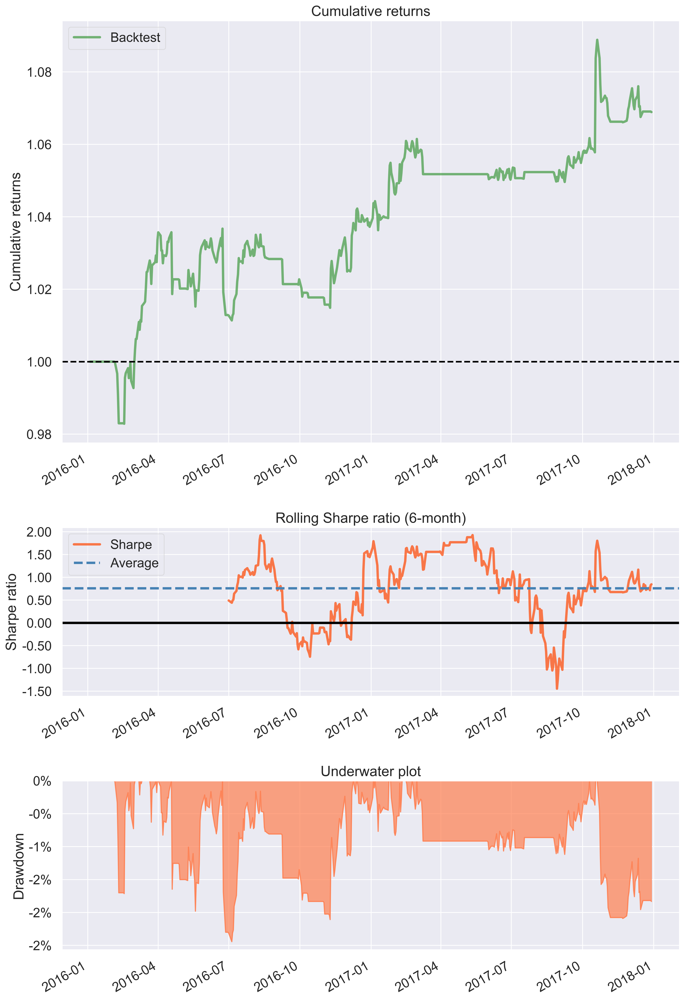

In [19]:
pf.create_simple_tear_sheet(returns)

In [20]:
pf.create_simple_tear_sheet(returns, positions, transactions, live_start_date='2017-01-01')

Start date,2016-01-04
End date,2017-12-29
Total months,23
,Backtest
Annual return,3.4%
Cumulative returns,6.9%
Annual volatility,4.1%
Sharpe ratio,0.84
Calmar ratio,1.39
Stability,0.82
Max drawdown,-2.4%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,2.44,2016-06-23,2016-07-05,2016-12-09,122
1,2.09,2017-10-20,2017-11-22,NaT,NaN
2,1.98,2016-04-18,2016-05-19,2016-06-23,49
3,1.71,2016-02-04,2016-02-17,2016-03-02,20
4,1.12,2017-03-01,2017-09-08,2017-10-10,160


Stress Events,mean,min,max
New Normal,0.01%,-1.69%,2.46%


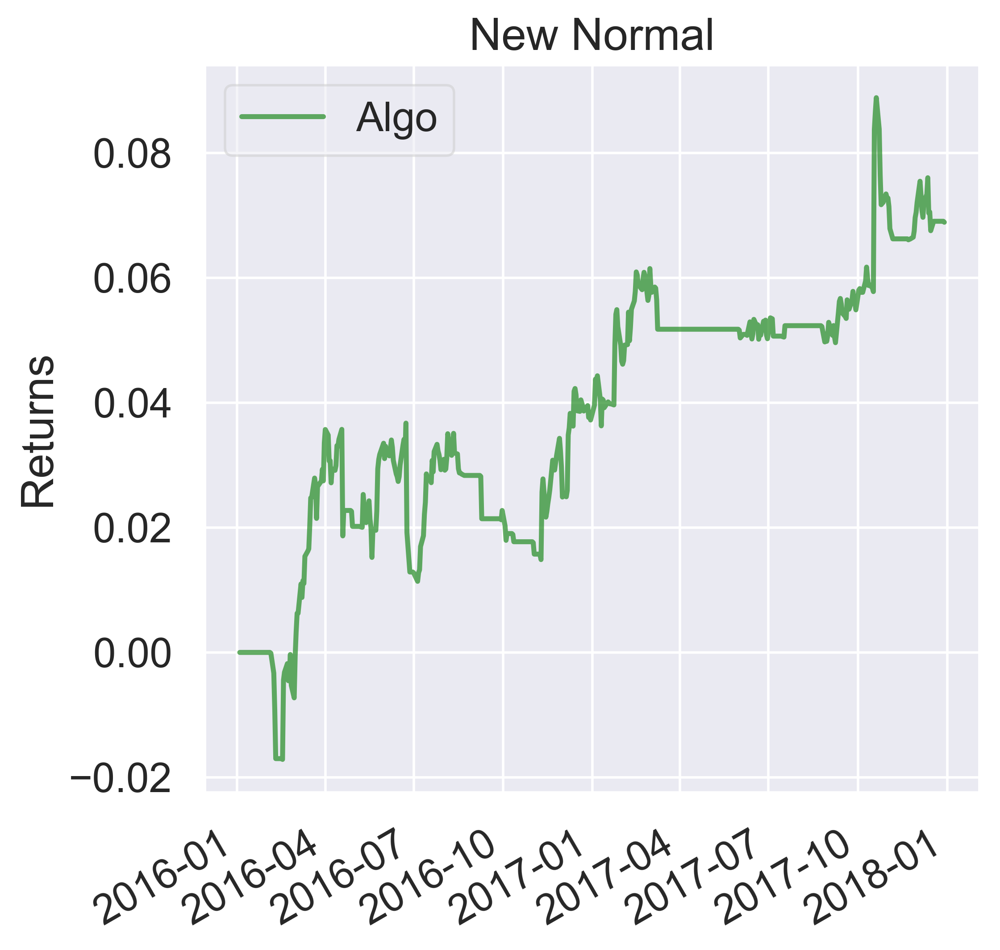

In [21]:
pf.create_full_tear_sheet(returns)